## Analysis of Unrestrained Fully Coupled Trajectory to Generate Parameters for Restraints

### Get Ligand Heavy Atoms. Find Potential Anchor Points for Each

Traj with thetaB ~ 2.6 taken from restrain lambda = 0.000 run 5  ~/Documents/research/restraint_comparison_mif/study/bound/boresch_l1_11_p1_4946

In [1]:
import MDAnalysis as mda
from MDAnalysis.analysis.distances import dist
from MDAnalysis.lib.distances import calc_dihedrals
import numpy as np
from numpy.linalg import norm
import matplotlib.pyplot as plt
import nglview as nv

u = mda.Universe("./lig1/SimSystem.top", "./lig1/lig1_truncated_end.nc")

lig_heavy = u.select_atoms("resname LIG and not name H*")

# anchors dict of dict. For each ligand heavy atom there is a dictionary of protein heavy atoms,
# for each of which there is a dictionary of average distance and standard deviation

anchors_dict = {}
for lig_atom in lig_heavy:
    for prot_atom in u.select_atoms(f"(protein or resname PRT) and (around 10 index {lig_atom.index}) and (not name H*)"): # protein does not recognise PRT
        anchors_dict[(lig_atom.index,prot_atom.index)]={}
        anchors_dict[(lig_atom.index, prot_atom.index)]["dists"]=[]
    

### Compute Average Distance and SD


In [2]:
for frame in u.trajectory:
    for lig_atom_index, prot_atom_index in anchors_dict.keys():
        distance = dist(mda.AtomGroup([u.atoms[lig_atom_index]]), mda.AtomGroup([u.atoms[prot_atom_index]]), box=frame.dimensions)[2][0]
        anchors_dict[(lig_atom_index,prot_atom_index)]["dists"].append(distance)

In [3]:
# change lists to numpy arrays
for pair in anchors_dict.keys():
    anchors_dict[pair]["dists"] = np.array(anchors_dict[pair]["dists"])

In [4]:
# calculate average and SD
for pair in anchors_dict.keys():
    anchors_dict[pair]["avg_dist"] = anchors_dict[pair]["dists"].mean()
    anchors_dict[pair]["sd_dist"] = anchors_dict[pair]["dists"].std()

In [5]:
# get n pairs with lowest SD
pairs_ordered_sd=[]
for item in sorted(anchors_dict.items(), key=lambda item: item[1]["sd_dist"]):
    pairs_ordered_sd.append(item[0])
    print(f'Pair: {item[0]}, av distance: {item[1]["avg_dist"]:.2f}, SD: {item[1]["sd_dist"]:.2f}')

Pair: (9, 1983), av distance: 9.82, SD: 0.30
Pair: (9, 1980), av distance: 8.92, SD: 0.30
Pair: (14, 1924), av distance: 6.50, SD: 0.30
Pair: (9, 1981), av distance: 9.11, SD: 0.30
Pair: (11, 1924), av distance: 7.89, SD: 0.30
Pair: (9, 1979), av distance: 7.54, SD: 0.30
Pair: (9, 1967), av distance: 4.92, SD: 0.31
Pair: (14, 1920), av distance: 8.82, SD: 0.31
Pair: (9, 1968), av distance: 6.21, SD: 0.33
Pair: (14, 1923), av distance: 7.89, SD: 0.33
Pair: (9, 1964), av distance: 6.73, SD: 0.33
Pair: (9, 1963), av distance: 5.26, SD: 0.33
Pair: (9, 1450), av distance: 8.67, SD: 0.33
Pair: (9, 1451), av distance: 7.34, SD: 0.33
Pair: (6, 1414), av distance: 6.93, SD: 0.33
Pair: (9, 1966), av distance: 4.52, SD: 0.33
Pair: (9, 1449), av distance: 9.29, SD: 0.34
Pair: (7, 1925), av distance: 7.82, SD: 0.34
Pair: (11, 1923), av distance: 9.27, SD: 0.34
Pair: (6, 1428), av distance: 7.10, SD: 0.34
Pair: (9, 1995), av distance: 9.96, SD: 0.34
Pair: (9, 1359), av distance: 4.90, SD: 0.35
Pair:

In [6]:
# Print out pairs with lowest SD
print("The ligand-protein atom pairs with the lowest SD in distance are:")
for i in range(5):
    print(f"{u.atoms[pairs_ordered_sd[i][0]]} and {u.atoms[pairs_ordered_sd[i][1]]}")


The ligand-protein atom pairs with the lowest SD in distance are:
<Atom 10: C6 of type C2 of resname LIG, resid 1 and segid SYSTEM> and <Atom 1984: CB of type C1 of resname VAL, resid 133 and segid SYSTEM>
<Atom 10: C6 of type C2 of resname LIG, resid 1 and segid SYSTEM> and <Atom 1981: CA of type C1 of resname VAL, resid 133 and segid SYSTEM>
<Atom 15: C11 of type C2 of resname LIG, resid 1 and segid SYSTEM> and <Atom 1925: CG1 of type C1 of resname VAL, resid 129 and segid SYSTEM>
<Atom 10: C6 of type C2 of resname LIG, resid 1 and segid SYSTEM> and <Atom 1982: C of type C2 of resname VAL, resid 133 and segid SYSTEM>
<Atom 12: C8 of type C1 of resname LIG, resid 1 and segid SYSTEM> and <Atom 1925: CG1 of type C1 of resname VAL, resid 129 and segid SYSTEM>


In [7]:
view3 = nv.show_mdanalysis(u)
#view3.add_representation('licorice', selection="resname LIG", color='orange')
view3.update_representation('licorice', selection='ligand', color='blue')
view3

NGLWidget(max_frame=699)

### For Pairs with Lowest Pairwise RMSDs, find Adjacent Heavy Atoms

In [8]:
def get_anchor_ats(a1_idx,u):
    """Takes in index of anchor atom 1 and universe and returns
    list of all three anchor atoms, which are chosen to be bonded
    and not H"

    Args:
        a1_idx (int): Index of the first anchor atom
        u (mda universe): The mda universe

    Returns:
        ints: The indices of all three anchor points
    """

    a1_at = u.atoms[a1_idx]
    bonded_heavy_at = a1_at.bonded_atoms.select_atoms("not name H*")
    a2_idx = bonded_heavy_at[0].index

    if len(bonded_heavy_at)>1:
        # not at end of chain
        a3_idx = bonded_heavy_at[1].index
        # Might be better to return all possible combinations
    else:
        # at end of chain, get next heavy atom along
        a3_idx = bonded_heavy_at[0].bonded_atoms.select_atoms("not name H*")[0].index

    return a1_idx, a2_idx, a3_idx

In [9]:
print(get_anchor_ats(pairs_ordered_sd[0][0],u))
print(get_anchor_ats(pairs_ordered_sd[0][1],u))

(9, 0, 5)
(1983, 1980, 1984)


### Use These As Anchors and Plot Variance of Associated Degrees of Freedom

In [10]:
def get_distance(idx1, idx2, u):
    """ Distance in Angstrom"""
    distance = dist(mda.AtomGroup([u.atoms[idx1]]), mda.AtomGroup([u.atoms[idx2]]), box=u.dimensions)[2][0]
    return distance

In [11]:
def get_angle(idx1, idx2, idx3, u):
    """Angle in rad"""
    C = u.atoms[idx1].position 
    B = u.atoms[idx2].position 
    A = u.atoms[idx3].position 
    BA = A - B
    BC = C - B
    angle = np.arccos(np.dot(BA, BC)/(norm(BA)*norm(BC)))
    return angle

In [12]:
def get_dihedral(idx1, idx2, idx3, idx4, u):
    """Dihedral in rad"""
    positions =[u.atoms[idx].position for idx in [idx1,idx2,idx3,idx4]]
    dihedral = calc_dihedrals(positions[0], positions[1], positions[2], positions[3], box = u.dimensions)
    return dihedral



In [13]:
def get_boresch_dof(l1,l2,l3,r1,r2,r3,u):
    """Calculate Boresch degrees of freedom from indices of anchor atoms"""
    # Ordering of connection of anchors is r3,r2,r1,l1,l2,l3
    r = get_distance(r1,l1,u)
    thetaA = get_angle(r2,r1,l1,u)
    thetaB = get_angle(r1,l1,l2,u)
    phiA = get_dihedral(r3,r2,r1,l1,u)
    phiB = get_dihedral(r2,r1,l1,l2,u)
    phiC = get_dihedral(r1,l1,l2,l3,u)
    # Not restrained but distance from coolinearity must be checked
    thetaR = get_angle(r3,r2,r1,u) # Receptor internal angle
    thetaL = get_angle(l1,l2,l3,u) # Ligand internal angle
    return r, thetaA, thetaB, phiA, phiB, phiC, thetaR, thetaL


In [14]:
lig_anchors = get_anchor_ats(pairs_ordered_sd[0][0],u)
prot_anchors = get_anchor_ats(pairs_ordered_sd[0][1],u)
get_boresch_dof(lig_anchors[0],lig_anchors[1],lig_anchors[2],prot_anchors[0],prot_anchors[1],prot_anchors[2],u)

(9.60581796268553,
 0.81629634,
 1.3623832,
 -2.7730287729373275,
 -0.9576030803472808,
 -1.8491532807864979,
 0.57492375,
 0.56838024)

In [15]:
# get values of degrees of freedom for lowest SD pairs across whole trajectory

boresch_dof_dict = {}
for pair in pairs_ordered_sd[:200]:
    boresch_dof_dict[pair]={}
    l1_idx, r1_idx = pair
    _, l2_idx, l3_idx = get_anchor_ats(l1_idx,u)
    _, r2_idx, r3_idx = get_anchor_ats(r1_idx,u)
    boresch_dof_dict[pair]["anchor_ats"]=[l1_idx,l2_idx,l3_idx,r1_idx,r2_idx,r3_idx]

    boresch_dof_list = ["r","thetaA","thetaB","phiA","phiB","phiC","thetaR","thetaL"]

    # Add sub dictionaries for each Boresch degree of freedom
    for dof in boresch_dof_list:
        boresch_dof_dict[pair][dof]={}
        boresch_dof_dict[pair][dof]["values"]=[]

    # Populate these dictionaries with values from trajectory
    n_frames = len(u.trajectory)

    for i, frame in enumerate(u.trajectory):
        r, thetaA, thetaB, phiA, phiB, phiC, thetaR, thetaL = get_boresch_dof(l1_idx,l2_idx,l3_idx,r1_idx,r2_idx,r3_idx,u)
        boresch_dof_dict[pair]["r"]["values"].append(r)
        boresch_dof_dict[pair]["thetaA"]["values"].append(thetaA)
        boresch_dof_dict[pair]["thetaB"]["values"].append(thetaB)
        boresch_dof_dict[pair]["phiA"]["values"].append(phiA)
        boresch_dof_dict[pair]["phiB"]["values"].append(phiB)
        boresch_dof_dict[pair]["phiC"]["values"].append(phiC)
        boresch_dof_dict[pair]["thetaR"]["values"].append(thetaR)
        boresch_dof_dict[pair]["thetaL"]["values"].append(thetaL)

        if i == n_frames-1:
            boresch_dof_dict[pair]["tot_var"]=0
            for dof in boresch_dof_list:
                boresch_dof_dict[pair][dof]["values"]=np.array(boresch_dof_dict[pair][dof]["values"])
                boresch_dof_dict[pair][dof]["avg"]=boresch_dof_dict[pair][dof]["values"].mean()
                # For dihedrals, compute variance and mean based on list of values corrected for periodic boundary at 
                # pi radians, because there is no problem with dihedrals in this region
                if dof[:3] == "phi":
                    avg = boresch_dof_dict[pair][dof]["avg"]

                    # correct variance - fully rigorous
                    corrected_values_sd = []
                    for val in boresch_dof_dict[pair][dof]["values"]:
                        dtheta = abs(val - avg)
                        corrected_values_sd.append(min(dtheta, 2*np.pi-dtheta))
                    corrected_values_sd = np.array(corrected_values_sd) 
                    boresch_dof_dict[pair][dof]["sd"]=corrected_values_sd.std()

                    # Correct mean (will fail if very well split above and below 2pi)
                    # get middle of interval based on current mean
                    corrected_values_avg=[]
                    periodic_bound = avg - np.pi
                    if periodic_bound < -np.pi:
                        periodic_bound+=2*np.pi
                    # shift vals from below periodic bound to above
                    for val in boresch_dof_dict[pair][dof]["values"]:
                        if val < periodic_bound:
                            corrected_values_avg.append(val+2*np.pi)
                        else:
                            corrected_values_avg.append(val)
                    corrected_values_avg = np.array(corrected_values_avg)
                    mean_corrected = corrected_values_avg.mean()
                    #shift mean back to normal range
                    if mean_corrected > np.pi:
                        boresch_dof_dict[pair][dof]["avg"]=mean_corrected-2*np.pi
                    else:
                        boresch_dof_dict[pair][dof]["avg"]=mean_corrected
                        
                else:
                    boresch_dof_dict[pair][dof]["sd"]=boresch_dof_dict[pair][dof]["values"].std()
                # Exclude variance of internal angles as these are not restrained
                if (dof != "thetaR" and dof != "thetaL"):
                    boresch_dof_dict[pair]["tot_var"]+=boresch_dof_dict[pair][dof]["sd"]**2
                # Assume Gaussian distributions and calculate force constants for harmonic potentials
                # so as to reproduce these distributions
                boresch_dof_dict[pair][dof]["k"]=0.593/(boresch_dof_dict[pair][dof]["sd"]**2) # RT at 289 K is 0.593 kcal mol-1


/tmp/ipykernel_515902/2090066218.py:8: RuntimeWarning: invalid value encountered in arccos
  angle = np.arccos(np.dot(BA, BC)/(norm(BA)*norm(BC)))


In [16]:
boresch_dof_dict

{(9, 1983): {'anchor_ats': [9, 0, 5, 1983, 1980, 1984],
  'r': {'values': array([ 9.60581796,  9.79028876,  9.73890376,  9.71926462, 10.23523803,
           9.77750152,  9.65765865,  9.56053815,  9.86388339,  9.56173407,
           9.7528899 ,  9.70656539,  9.58032316, 10.34267235,  9.94196434,
           9.99031912,  9.70209446,  9.79347902, 10.08747569, 10.12675033,
           9.81109262, 10.06607301,  9.84399208,  9.59385133, 10.15574431,
           9.53199533, 10.22573192, 10.28673767,  9.83492745,  9.83023579,
           9.46880298, 10.03844454, 10.03563863,  9.6494001 , 10.32906485,
          10.08584493, 10.09402684,  9.95400581,  9.94714856,  9.85664453,
           9.54237636,  9.77561248,  9.82695543,  9.75624772, 10.30729946,
          10.35933159,  9.746552  ,  9.98262364,  9.89117662,  9.84487005,
           9.78951983,  9.75463423,  9.85700427,  9.84733753,  9.91442735,
           9.31940383, 10.12340388, 10.06500999,  9.61494933,  9.74800878,
           9.75828088,  9.602

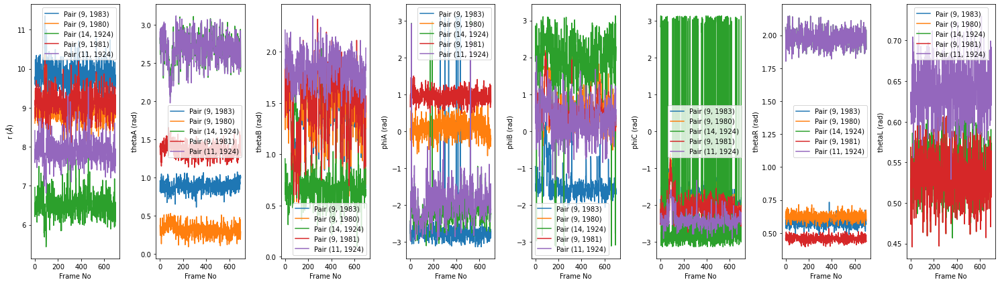

In [26]:
#boresch_dof_list = ["r","thetaA","thetaB","phiA","phiB","phiC","thetaR","thetaL"]
boresch_dof_list = ["r","thetaA","thetaB","phiA","phiB","phiC","thetaR","thetaL"]

# Plot avg and sd of dof for Boresch dof from top 10 lowest SD pairs

num_pairs = 5
n_dof = len(boresch_dof_list)

fig, axs = plt.subplots(1,n_dof, figsize=(2.6*n_dof,6))
for i, dof in enumerate(boresch_dof_list):
    for j, pair in enumerate(boresch_dof_dict.keys()):
        axs[i].plot([x for x in range(700)], boresch_dof_dict[pair][dof]["values"],label=f"Pair {pair}")
        if dof == "r":
            axs[i].set_ylabel("r ($\AA$)")
        else:
            axs[i].set_ylabel(f"{dof} (rad)")
        if j == num_pairs-1:
            break
    axs[i].set_xlabel("Frame No")
    axs[i].legend()
fig.tight_layout()



### Filter, Pick Optimum Degrees of Freedom, and Select Force Constants Based on Variance, Select Equilibrium Values

In [19]:
# Order pairs according to variance 
pairs_ordered_boresch_var=[]
for item in sorted(boresch_dof_dict.items(), key=lambda item: item[1]["tot_var"]):
    pairs_ordered_boresch_var.append(item[0])
    print(f'Pair: {item[0]}, total variance: {boresch_dof_dict[item[0]]["tot_var"]}')

# Filter out r <1, theta >150 or < 30 
selected_pairs_boresch = []
for pair in pairs_ordered_boresch_var:
    cond_dist = boresch_dof_dict[pair]["r"]["avg"] > 1
    avg_angles =[]
    #angles = ["thetaA", "thetaB", "thetaR","thetaL"] # also check internal angles
    angles = ["thetaA", "thetaB"] # May also be good to check internal angles
    for angle in angles:
        avg_angles.append(boresch_dof_dict[pair][angle]["avg"])
    cond_angles = list(map(lambda x: (x<2.62 and x >0.52),avg_angles))
    if cond_dist and all(cond_angles):
        selected_pairs_boresch.append(pair)

print(selected_pairs_boresch)


Pair: (11, 1923), total variance: 0.2196169474974531
Pair: (5, 1436), total variance: 0.28286423506382896
Pair: (5, 1430), total variance: 0.28412933907805354
Pair: (9, 1341), total variance: 0.28928900323628504
Pair: (9, 1456), total variance: 0.2932642849100588
Pair: (9, 1450), total variance: 0.2951179372176983
Pair: (9, 1981), total variance: 0.2977139529022038
Pair: (9, 1983), total variance: 0.2978241976520287
Pair: (14, 1925), total variance: 0.29902954254047337
Pair: (5, 1449), total variance: 0.3012844322671851
Pair: (5, 1435), total variance: 0.30134029045528976
Pair: (9, 1457), total variance: 0.30162423049964243
Pair: (9, 1437), total variance: 0.3019300421421052
Pair: (5, 1431), total variance: 0.3115037420636833
Pair: (14, 1923), total variance: 0.31200508016785694
Pair: (9, 1342), total variance: 0.3125021546886819
Pair: (9, 1985), total variance: 0.31542094363661366
Pair: (9, 1359), total variance: 0.3202627911761195
Pair: (9, 1982), total variance: 0.320617739188803
Pa

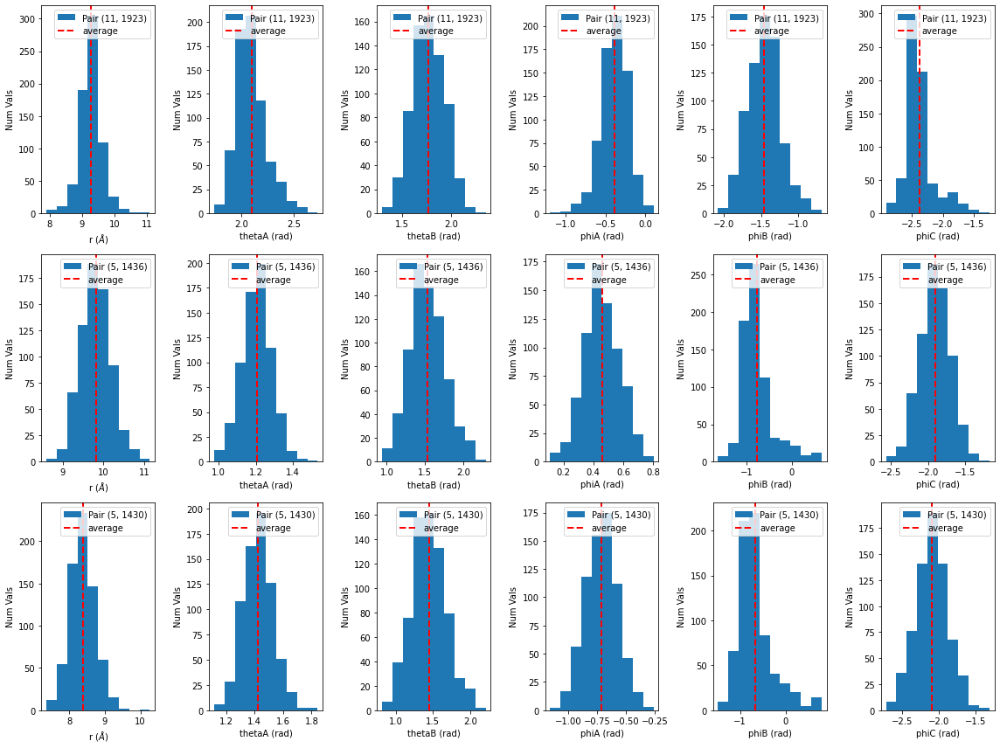

In [20]:
# Plot histograms

fig, axs = plt.subplots(len(selected_pairs_boresch[:3]),6, figsize=(16,4*len(selected_pairs_boresch[:3])))
for pair_idx, pair in enumerate(selected_pairs_boresch[:3]):
    #pair_idx=0
    for i, dof in enumerate(["r","thetaA","thetaB","phiA","phiB","phiC"]):
        axs[pair_idx][i].hist(boresch_dof_dict[pair][dof]["values"],bins=10,label=f"Pair {pair}")
        axs[pair_idx][i].axvline(x=boresch_dof_dict[pair][dof]["avg"], color='r', linestyle='dashed', linewidth=2,label="average")
        if dof == "r":
            axs[pair_idx][i].set_xlabel("r ($\AA$)")
        else:
            axs[pair_idx][i].set_xlabel(f"{dof} (rad)")
        axs[pair_idx][i].set_ylabel("Num Vals")
        axs[pair_idx][i].legend()
fig.tight_layout()


In [21]:
# Print out Boresch parameters

def print_boresch_params(pair):
    l1 = boresch_dof_dict[pair]["anchor_ats"][0]
    l2 = boresch_dof_dict[pair]["anchor_ats"][1]
    l3 = boresch_dof_dict[pair]["anchor_ats"][2]
    r1 = boresch_dof_dict[pair]["anchor_ats"][3]
    r2 = boresch_dof_dict[pair]["anchor_ats"][4]
    r3 = boresch_dof_dict[pair]["anchor_ats"][5]
    r0 = boresch_dof_dict[pair]["r"]["avg"]
    thetaA0 = boresch_dof_dict[pair]["thetaA"]["avg"]
    thetaB0 = boresch_dof_dict[pair]["thetaB"]["avg"]
    phiA0 = boresch_dof_dict[pair]["phiA"]["avg"]
    phiB0 = boresch_dof_dict[pair]["phiB"]["avg"]
    phiC0 = boresch_dof_dict[pair]["phiC"]["avg"]
    kr = boresch_dof_dict[pair]["r"]["k"]
    kthetaA = boresch_dof_dict[pair]["thetaA"]["k"]
    kthetaB = boresch_dof_dict[pair]["thetaB"]["k"]
    kphiA = boresch_dof_dict[pair]["phiA"]["k"]
    kphiB = boresch_dof_dict[pair]["phiB"]["k"]
    kphiC = boresch_dof_dict[pair]["phiC"]["k"]

    print(f'{{"anchor_points":{{"r1":{r1}, "r2":{r2}, "r3":{r3}, "l1":{l1}, "l2":{l2}, "l3":{l3}}},\
    "equilibrium_values":{{"r0":{r0:.2f}, "thetaA0":{thetaA0:.2f}, "thetaB0":{thetaB0:.2f},"phiA0":{phiA0:.2f}, "phiB0":{phiB0:.2f}, "phiC0":{phiC0:.2f}}},\
    "force_constants":{{"kr":{kr:.2f}, "kthetaA":{kthetaA:.2f}, "kthetaB":{kthetaB:.2f}, "kphiA":{kphiA:.2f}, "kphiB":{kphiB:.2f}, "kphiC":{kphiC:.2f}}}}}')




In [22]:
print_boresch_params(selected_pairs_boresch[0])

{"anchor_points":{"r1":1923, "r2":1920, "r3":1924, "l1":11, "l2":2, "l3":8},    "equilibrium_values":{"r0":9.27, "thetaA0":2.09, "thetaB0":1.77,"phiA0":-0.39, "phiB0":-1.45, "phiC0":-2.37},    "force_constants":{"kr":5.09, "kthetaA":28.32, "kthetaB":23.34, "kphiA":53.38, "kphiB":32.46, "kphiC":21.58}}


In [23]:
print(get_anchor_ats(selected_pairs_boresch[0][0],u))
print(get_anchor_ats(selected_pairs_boresch[0][1],u))


(11, 2, 8)
(1923, 1920, 1924)


In [24]:
selected_pairs_boresch[0]

(11, 1923)